In [281]:
import sys
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm

sys.path.insert(1, '../')

from rule_extraction import *

%load_ext autoreload
%autoreload 2
%matplotlib widget

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load Logfiles from data-directory

In [282]:
# YOU NEED TO CHANGE THIS PATH TO THE DIRECTORY WHERE THE DATA IS STORED
PATH = "../data/data-cluster-examples-pause"

dataPairs = []
directories = []
for root, dirs, files in os.walk(PATH):
    for name in dirs:
        directories.append(os.path.join(root, name))


for directory in directories:
    print(f"Processing {directory}")

    # if "fallingDrop" not in directory:
    #     print(f"Skipping {directory}")
    #     continue

    files = os.listdir(directory)

    # group files by time AutoPas_liveInfoLogger_Rank0_$2024-05-21_14-24-17$
    data_pairs = {}
    for file in files:
        if "tuningData" in file or "liveInfo" in file:
            time = file.split("_")[-1]

            if not time in data_pairs:
                data_pairs[time] = [None, None]

            if "tuningData" in file:
                data_pairs[time][1] = pd.read_csv(
                    os.path.join(directory, file))
            elif "liveInfo" in file:
                data_pairs[time][0] = pd.read_csv(
                    os.path.join(directory, file))

    # check if tuning and liveInfo files are present
    for time, pair in data_pairs.items():
        if pair[0] is None or pair[1] is None:
            print(f"Missing file for {directory} at time {time}")
            continue

    # filter rows where NaN is present

    for time, (liveInfo, tuningData) in data_pairs.items():
        tuning_iterations = tuningData["Iteration"]

        corresponding_liveInfo = liveInfo.loc[liveInfo["Iteration"].isin(
            tuning_iterations)]

        # assert len(corresponding_liveInfo) == len(
        #     tuningData), "Length of liveInfo and tuningData does not match"

        # strip columns
        corresponding_liveInfo.columns = corresponding_liveInfo.columns.str.strip()
        tuningData.columns = tuningData.columns.str.strip()

        # merge container and Data Layout
        tuningData["ContainerDataLayout"] = tuningData["Container"] + \
            "_" + tuningData["Data Layout"]

        # tuningData.drop(columns=["Container", "Data Layout"], inplace=True)

        dataPairs.append((corresponding_liveInfo, tuningData))

        # describe data
        # print(f"Time: {time}")
        # print(corresponding_liveInfo["avgParticlesPerCell"].describe())
        # print("")

Processing ../data/data-cluster-examples-pause/uniformCube_b_2
Processing ../data/data-cluster-examples-pause/uniform_cube_a_2
Processing ../data/data-cluster-examples-pause/uniform_cube_a_1
Processing ../data/data-cluster-examples-pause/explodingLiquid_1
Processing ../data/data-cluster-examples-pause/SpinodalDecomposition_equilibration_1
Processing ../data/data-cluster-examples-pause/SpinodalDecomposition_equilibration_2
Processing ../data/data-cluster-examples-pause/explodingLiquid_2
Processing ../data/data-cluster-examples-pause/fallingDrop_2
Processing ../data/data-cluster-examples-pause/uniformCube_b_1
Processing ../data/data-cluster-examples-pause/SpinodalDecomposition_2
Processing ../data/data-cluster-examples-pause/fallingDrop_1
Processing ../data/data-cluster-examples-pause/SpinodalDecomposition_1


# Create Dataframe with all logfiles from data-directory

In [283]:
df = pd.DataFrame()

for batch, (X, y) in enumerate(dataPairs):
    merged = pd.merge(X, y, on="Iteration")
    df = pd.concat([df, merged])

df = df.drop(columns=["Iteration", "Date_x", "Date_y"])
df = df.drop(list(df.filter(regex='sample')), axis=1)
df.shape

(180529, 30)

In [284]:
df.describe()

df.head(10)

,avgParticlesPerCell,cutoff,domainSizeX,domainSizeY,domainSizeZ,estimatedNumNeighborInteractions,homogeneity,maxDensity,maxParticlesPerCell,minParticlesPerCell,...,threadCount,Container,CellSizeFactor,Traversal,Load Estimator,Data Layout,Newton 3,Reduced,Smoothed,ContainerDataLayout
0,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c01,none,AoS,disabled,22964350.0,22964350.0,LinkedCells_AoS
1,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c01,none,SoA,disabled,21511665.0,21511665.0,LinkedCells_SoA
2,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,AoS,disabled,19633948.0,19633948.0,LinkedCells_AoS
3,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,AoS,enabled,13421045.0,13421045.0,LinkedCells_AoS
4,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,SoA,disabled,20298967.0,20298967.0,LinkedCells_SoA
5,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,SoA,enabled,14474746.0,14474746.0,LinkedCells_SoA
6,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,AoS,disabled,19792369.0,19792369.0,LinkedCells_AoS
7,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,AoS,enabled,13082756.0,13082756.0,LinkedCells_AoS
8,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,SoA,disabled,19870901.0,19870901.0,LinkedCells_SoA
9,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,SoA,enabled,13517639.0,13517639.0,LinkedCells_SoA


# Define Interesting Data to include in the Training-Data


In [285]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'Container', 'CellSizeFactor', 'Traversal', 'Load Estimator',
       'Data Layout', 'Newton 3', 'Reduced', 'Smoothed',
       'ContainerDataLayout'],
      dtype='object')

In [286]:
inputs = [
    "avgParticlesPerCell",
    # "cutoff",
    # "domainSizeX",
    # "domainSizeY",
    # "domainSizeZ",
    # "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    # "minParticlesPerCell",
    # "numCells",
    # "numEmptyCells",
    # "numHaloParticles",
    # "numParticles",
    # "particleSize",
    # "particleSizeNeededByFunctor",
    # "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    # "rebuildFrequency",
    # "skin",
    "threadCount",
]

outputs = [
    "ContainerDataLayout",
    # "Container",
    # "Data Layout",
    # "CellSizeFactor",
    "Traversal",
    # "Load Estimator",
    "Newton 3",
]

# Group all the Data from the same Tuning-Phase together

> this requires the -PauseSimulationDuringTuning flag to be set to true

In [287]:
group_by = [
    "avgParticlesPerCell",
    "cutoff",
    "domainSizeX",
    "domainSizeY",
    "domainSizeZ",
    "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    "minParticlesPerCell",
    "numCells",
    "numEmptyCells",
    "numHaloParticles",
    "numParticles",
    "particleSize",
    "particleSizeNeededByFunctor",
    "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    "rebuildFrequency",
    "skin",
    "threadCount",
]


# only keep rows where performance percentage is above x
print("Orignal length", len(df))

# group data on input columns
grouped = df.groupby(group_by)


def add_Speedup_column(group):
    min_smoothed = group['Smoothed'].min()
    result = group.copy()
    result['speedup'] = min_smoothed / result['Smoothed']
    return result


grouped_speedup = grouped.apply(
    add_Speedup_column).reset_index(drop=True)

grouped_speedup.drop(columns=["Smoothed", "Reduced"], inplace=True)

#ungroup
data=grouped_speedup.reset_index(drop=True)

Orignal length 180529


/tmp/ipykernel_89745/2522148363.py:40: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_speedup = grouped.apply(


# If desired remove outliers from the Dataset

In [288]:
Z_THRESHHOLD = 3
for column in inputs:
    z = np.abs(stats.zscore(data[column]))
    data = data[z < Z_THRESHHOLD]

print("Outliers removed length", len(data))


# filter values occuring less than pct
SPARSE_CUTOFF = 0.01
for column in outputs:
    counts = data[column].value_counts()

    sparse_values = data[column].isin(
        counts[counts > len(data) * SPARSE_CUTOFF].index)

    data = data[sparse_values]


print("Sparse values removed length", len(data))

Outliers removed length 167440
Sparse values removed length 159600


# Create Train and Test Data


In [289]:
relevantData=data[inputs+outputs+["speedup"]]

X_train, X_test, y_train, y_test = train_test_split(
    relevantData.drop(columns=["speedup"]), pd.DataFrame(relevantData["speedup"])
    , test_size=0.2, random_state=42)

# save to csv
pd.concat([X_train, y_train], axis=1).to_pickle("train.pkl")
pd.concat([X_test, y_test], axis=1).to_pickle("test.pkl")

# Final Data


In [290]:
SUITABILITY_LABELS = ["terrible", "rubbish",
                      "bad", "medium", "ok", "good", "excellent"]
y_train_suited = pd.cut(y_train["speedup"], 7, labels=SUITABILITY_LABELS)
pd.concat([X_train, y_train["speedup"], y_train_suited], axis=1)

,avgParticlesPerCell,homogeneity,maxDensity,maxParticlesPerCell,particlesPerCellStdDev,threadCount,ContainerDataLayout,Traversal,Newton 3,speedup,speedup
49450,0.905797,0.035496,0.531948,23,0.012989,1,LinkedCells_AoS,lc_sliced,enabled,0.450641,bad
167724,2.201487,0.086152,0.627706,13,0.014430,24,VerletListsCells_AoS,vlc_sliced_balanced,disabled,0.594117,medium
92462,0.905797,0.043115,0.319169,18,0.013617,4,LinkedCells_AoS,lc_sliced_c02,enabled,0.454632,bad
151117,0.944637,0.083797,0.691920,22,0.040474,28,VerletClusterLists_AoS,vcl_c06,disabled,0.319094,rubbish
91781,0.905797,0.043133,0.315623,19,0.013579,28,VerletListsCells_AoS,vlc_sliced_c02,disabled,0.673052,ok
...,...,...,...,...,...,...,...,...,...,...,...
133714,0.944637,0.079441,0.554280,21,0.040082,12,LinkedCells_SoA,lc_sliced_c02,enabled,0.989101,excellent
117529,0.944637,0.070202,0.305040,8,0.033701,1,VerletListsCells_SoA,vlc_c18,disabled,0.495985,medium
145767,0.944637,0.077611,0.483600,22,0.040346,12,VerletClusterLists_AoS,vcl_c06,disabled,0.238614,rubbish
160702,0.944637,0.085856,0.468720,21,0.040808,28,LinkedCells_SoA,lc_sliced,enabled,0.984618,excellent


# Train Decision Tree and Extract Rules


In [291]:
# number of input parameters that can be used simultaneously
from collections import defaultdict
POSSIBLE_NUMBER_OF_COMBINATIONS = [2, 3, 4, 5]


CCP_ALPHA = defaultdict(lambda: 0.05)

# maximum depth of the decision tree
MAX_DEPTH = 10

# how many models should be created for each label
TOP_K_MODELS_PER_LABEL = 1

In [292]:
auto_rules: dict = {}

output_variables = []


for config, group in tqdm(pd.concat([X_train, y_train], axis=1).groupby(outputs)):
    # join tuple
    name = "Suitability " + "_".join([str(v) for c, v in zip(outputs, config)])

    data = group[inputs]
    pred = group["speedup"]

    # add category column to y train based on speedup

    def mapping(value):
        label = SUITABILITY_LABELS[min(
            int(value * len(SUITABILITY_LABELS)), len(SUITABILITY_LABELS)-1)]
        return f"{label}"

    y_train_labels = pd.DataFrame()
    y_train_labels[name] = pred.apply(mapping)

    output_variables.append(name)

    new_rules = create_auto_rules(data, y_train_labels, None,
                                  POSSIBLE_NUMBER_OF_COMBINATIONS, CCP_ALPHA, MAX_DEPTH, TOP_K_MODELS_PER_LABEL, plot=False)

    auto_rules.update(new_rules)

  0%|          | 0/50 [00:00<?, ?it/s]

Training on 2511 samples
Suitability LinkedCells_AoS_lc_c01_disabled: ['homogeneity', 'maxDensity', 'particlesPerCellStdDev', 'threadCount'] (score=0.95)
Number of rules 10:
	Suitability LinkedCells_AoS_lc_c01_disabled (10 rules)
Training on 2550 samples
Suitability LinkedCells_AoS_lc_c04_disabled: ['homogeneity', 'maxDensity', 'maxParticlesPerCell', 'threadCount'] (score=0.76)
Number of rules 10:
	Suitability LinkedCells_AoS_lc_c04_disabled (10 rules)
Training on 2536 samples
Suitability LinkedCells_AoS_lc_c04_enabled: ['maxDensity', 'threadCount'] (score=0.86)
Number of rules 5:
	Suitability LinkedCells_AoS_lc_c04_enabled (5 rules)
Training on 2527 samples
Suitability LinkedCells_AoS_lc_c08_disabled: ['particlesPerCellStdDev', 'threadCount'] (score=0.84)
Number of rules 4:
	Suitability LinkedCells_AoS_lc_c08_disabled (4 rules)
Training on 2499 samples
Suitability LinkedCells_AoS_lc_c08_enabled: ['avgParticlesPerCell', 'particlesPerCellStdDev', 'threadCount'] (score=0.83)
Number of ru

# Create Rules from Decision Tree

Follows https://www.sciencedirect.com/science/article/pii/S0165011406002533


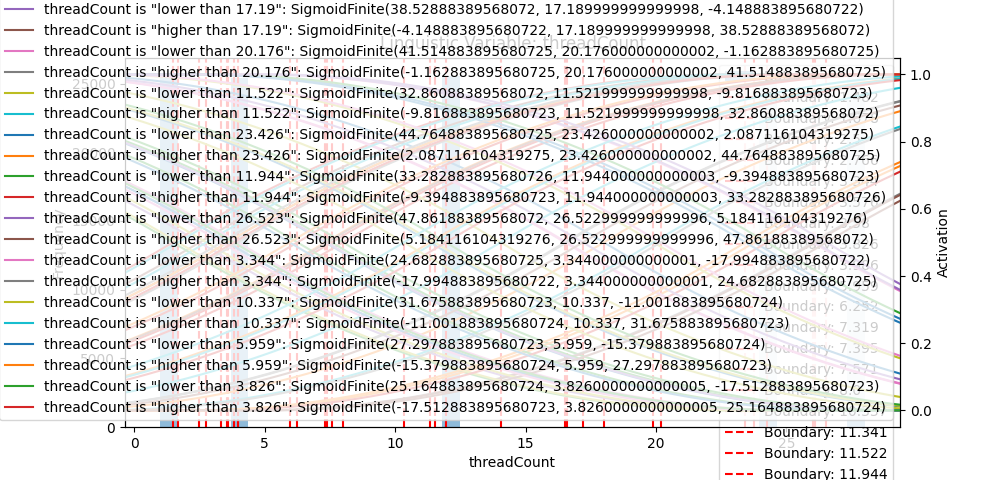

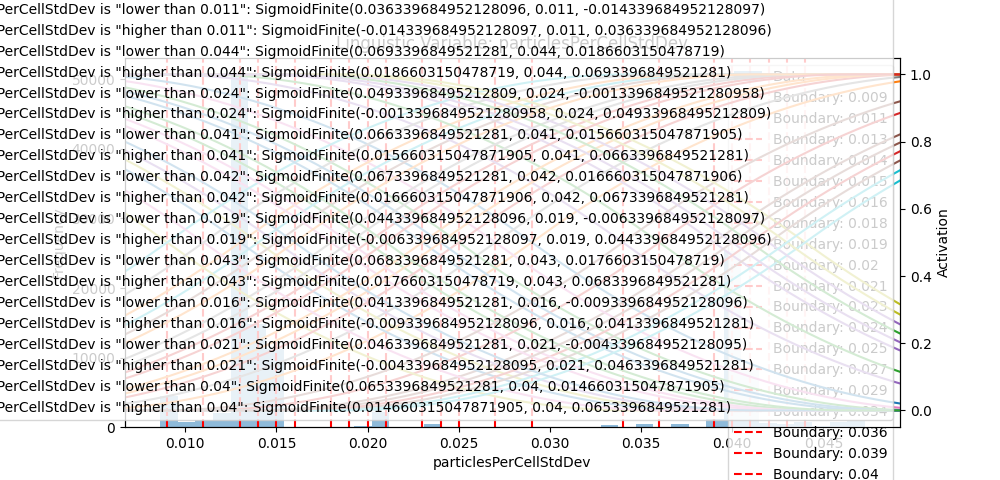

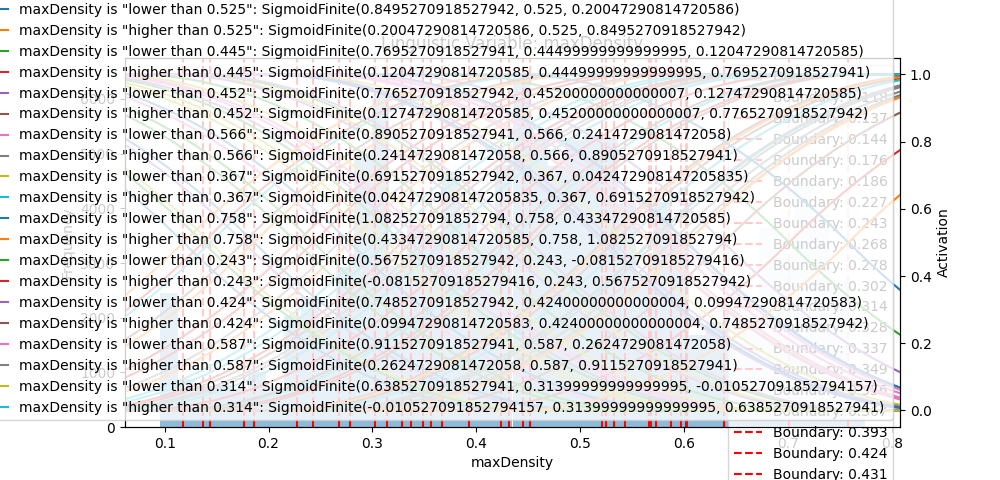

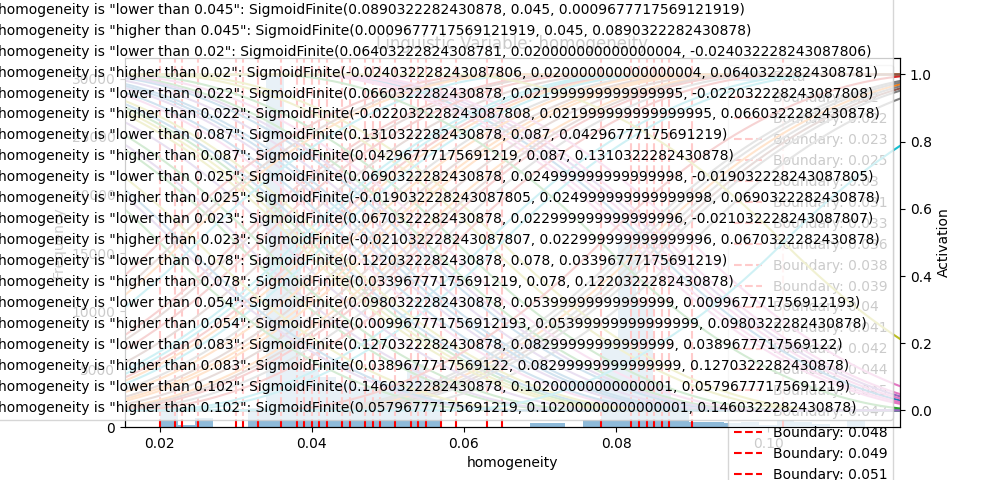

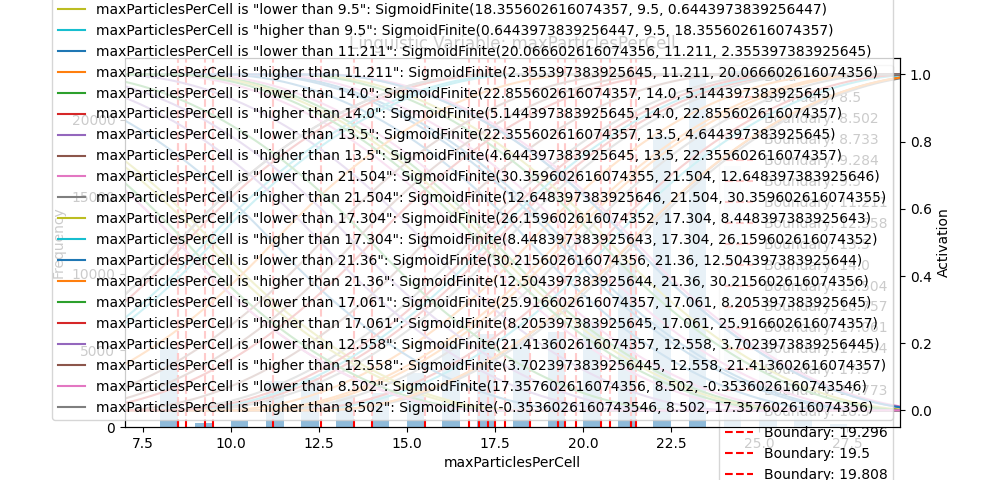

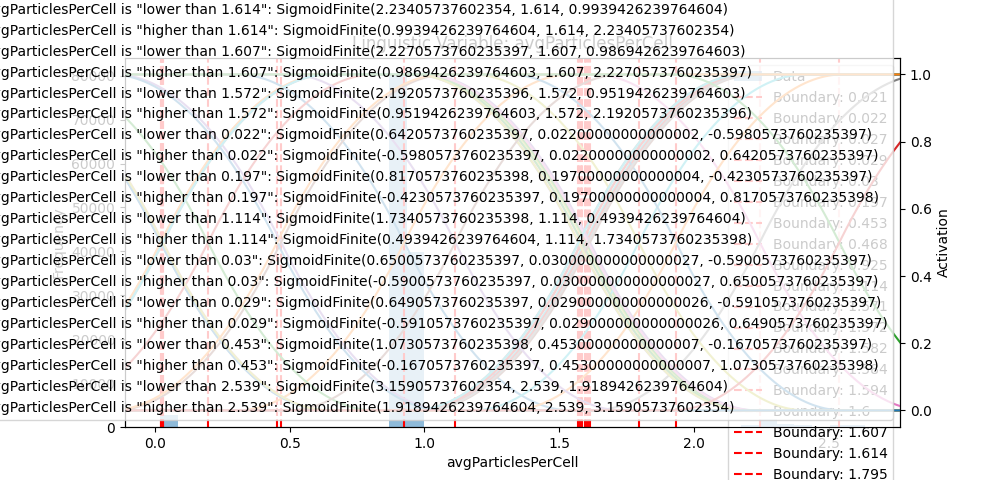

In [293]:
inputVariables, rules = create_rules_approach2(
    X_train, auto_rules)

In [294]:
def make_direct_output_membership_functions(output_variables):
    outputRangeMembershipFunctions: dict[str, LinguisticVariable] = {}

    for col in output_variables:

        split_values = SUITABILITY_LABELS

        base_set = Set(Set.SetType.CONTINUOUS, (0, 1))
        crisp_set = CrispSet({(col, base_set)})

        outputRangeMembershipFunctions[col] = LinguisticVariable(crisp_set)

        for i, entry in enumerate(split_values):
            spacing = 1/(len(split_values)+1)
            mean = (i+1)*spacing
            std = 2*(spacing/len(split_values))

            if i == 0 or i == len(split_values)-1:
                std = std*2
                factor = -1 if i == 0 else 1
                shifted_centre = mean-factor*0.05
                outputRangeMembershipFunctions[col].add_linguistic_term(
                    Sigmoid(entry, shifted_centre, 30*factor))
            else:

                outputRangeMembershipFunctions[col].add_linguistic_term(
                    Gaussian(entry, mean, std))

    return outputRangeMembershipFunctions


outputVariables = make_direct_output_membership_functions(output_variables)

In [295]:
def createOutputMapping(output_variables):
    outputMapping = {}

    for output_variable in output_variables:
        outputMapping[output_variable] = f"\"{output_variable}\":\n  1 => [container=\"?\", dataLayout=\"?\", traversal=\"?\", newton3=\"?\"]"

    return outputMapping


output_mapping = createOutputMapping(output_variables)

In [296]:
display(rules_to_table(rules, "Approach 2"))

/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/rule_extraction.py:939: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  table = table.applymap(
/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/rule_extraction.py:942: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  table = table.applymap(


# Save all the data


In [297]:
save_linguistic_variables(inputVariables, "suitability-rules/fuzzy-inputs.txt")
save_linguistic_variables(outputVariables,
                          "suitability-rules/fuzzy-outputs.txt")

save_fuzzy_rules(rules, "suitability-rules/fuzzy-rules.txt")

In [298]:
FRULE_TEMPLATE = """# Setup

# Here global settings for all fuzzy systems can be defined.
# Currently it is not possible to define different settings for different fuzzy systems.
FuzzySystemSettings:
    defuzzificationMethod: "centerOfGravity"
    interpretOutputAs: "Suitability"
    suitabilityThreshold: "1"


# Fuzzy Variables

# Next all of the fuzzy variables are defined. Each fuzzy variable has a domain and a range.
# The domain specifies the input for the fuzzy variable. At the moment it is only possible to use
# values of the LiveInfoStruct as domain. The range of this variable also needs to be passed as it
# is important for the defuzzification process.
# Each fuzzy variable can have multiple fuzzy sets. Each fuzzy set is defined by a name and a membership function.

{{INPUT_VARIABLES}}

{{OUTPUT_VARIABLES}}    


# Output Mapping

# The OutputMapping specify how the results of the fuzzy system should be mapped to the actual configurations which should be tested.
# In this case each fuzzy variable only has a single configuration, namely itself. You need to fill this in manually. Sorry :(

{{OUTPUT_MAPPING}}

# Rules

# The rules define how the input variables are combined to output variables and should encode the expert knowledge.
# The rules are defined in a simple if-then format.

{{RULES}}
"""


def create_frule_file(inputs, outputs, rules, output_mapping):
    input_variables = format_linguistic_variables(inputs)
    output_variables = format_linguistic_variables(outputs)
    rules = format_rules(rules)

    output_mapping = "OutputMapping:\n" + \
        "\n".join([output_mapping[key] for key in output_mapping])

    fruleFile = FRULE_TEMPLATE.replace(
        "{{INPUT_VARIABLES}}", input_variables).replace("{{OUTPUT_VARIABLES}}", output_variables).replace("{{OUTPUT_MAPPING}}", output_mapping).replace("{{RULES}}", rules)

    with open("suitability-rules/fuzzyrules-suitability.frule", "w") as file:
        file.write(fruleFile)

In [299]:
create_frule_file(inputVariables, outputVariables, rules, output_mapping)